## 1) Prepare a classification model using Naive Bayes for salary data

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
train1=pd.read_csv('/content/SalaryData_Train.csv')
train1.head()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K


In [ ]:
train1.shape

(27961, 14)

In [ ]:
train1.columns

Index(['age', 'workclass', 'education', 'educationno', 'maritalstatus',
       'occupation', 'relationship', 'race', 'sex', 'capitalgain',
       'capitalloss', 'hoursperweek', 'native', 'Salary'],
      dtype='object')

In [ ]:
train1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27961 entries, 0 to 27960
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   age            27961 non-null  int64  
 1   workclass      27961 non-null  object 
 2   education      27961 non-null  object 
 3   educationno    27961 non-null  int64  
 4   maritalstatus  27960 non-null  object 
 5   occupation     27960 non-null  object 
 6   relationship   27960 non-null  object 
 7   race           27960 non-null  object 
 8   sex            27960 non-null  object 
 9   capitalgain    27960 non-null  float64
 10  capitalloss    27960 non-null  float64
 11  hoursperweek   27960 non-null  float64
 12  native         27960 non-null  object 
 13  Salary         27960 non-null  object 
dtypes: float64(3), int64(2), object(9)
memory usage: 3.0+ MB


In [ ]:
train1['Salary'].unique()

array([' <=50K', ' >50K', nan], dtype=object)

In [ ]:
train1['Salary'].value_counts()

 <=50K    21028
 >50K      6932
Name: Salary, dtype: int64

In [ ]:
from sklearn.preprocessing import LabelEncoder,MinMaxScaler

In [ ]:
le=LabelEncoder()
mms=MinMaxScaler()

In [ ]:
train1['workclass']=le.fit_transform(train1['workclass'])
train1['education']=le.fit_transform(train1['education'])
train1['maritalstatus']=le.fit_transform(train1['maritalstatus'])
train1['occupation']=le.fit_transform(train1['occupation'])
train1['relationship']=le.fit_transform(train1['relationship'])
train1['race']=le.fit_transform(train1['race'])
train1['sex']=le.fit_transform(train1['sex'])
train1['native']=le.fit_transform(train1['native'])
train1['Salary']=le.fit_transform(train1['Salary'])


In [ ]:
train1['capitalgain']=mms.fit_transform(train1['capitalgain'].values.reshape(-1,1))
train1['capitalloss']=mms.fit_transform(train1['capitalloss'].values.reshape(-1,1))
train1['hoursperweek']=mms.fit_transform(train1['hoursperweek'].values.reshape(-1,1))

In [ ]:
train1

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,0.02174,0.0,0.397959,37,0
1,50,4,9,13,2,3,0,4,1,0.00000,0.0,0.122449,37,0
2,38,2,11,9,0,5,1,4,1,0.00000,0.0,0.397959,37,0
3,53,2,1,7,2,5,0,2,1,0.00000,0.0,0.397959,37,0
4,28,2,9,13,2,9,5,2,0,0.00000,0.0,0.397959,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27956,42,2,8,11,0,9,1,4,0,0.00000,0.0,0.397959,37,0
27957,33,2,11,9,2,4,0,4,1,0.00000,0.0,0.500000,37,0
27958,21,2,11,9,4,9,3,4,0,0.00000,0.0,0.295918,37,0
27959,69,1,0,6,2,13,0,4,1,0.00000,0.0,0.091837,37,0


In [ ]:
train1.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
27956    False
27957    False
27958    False
27959    False
27960    False
Length: 27961, dtype: bool

In [ ]:
train1[train1.duplicated()]

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
326,33,2,9,13,2,3,0,4,1,0.0,0.0,0.397959,37,1
364,27,2,9,13,4,2,1,4,1,0.0,0.0,0.500000,37,0
518,24,2,11,9,4,5,4,2,0,0.0,0.0,0.397959,37,0
525,24,2,11,9,4,2,3,4,1,0.0,0.0,0.397959,37,0
619,33,2,9,13,2,3,0,4,1,0.0,0.0,0.397959,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27937,26,2,11,9,2,2,0,4,1,0.0,0.0,0.397959,37,0
27938,54,4,9,13,2,3,0,4,1,0.0,0.0,0.397959,37,1
27939,18,2,1,7,4,11,3,4,0,0.0,0.0,0.193878,37,0
27944,50,2,9,13,2,3,0,4,1,0.0,0.0,0.500000,37,1


In [ ]:
train1.drop_duplicates(inplace=True)

In [ ]:
train1.shape

(25042, 14)

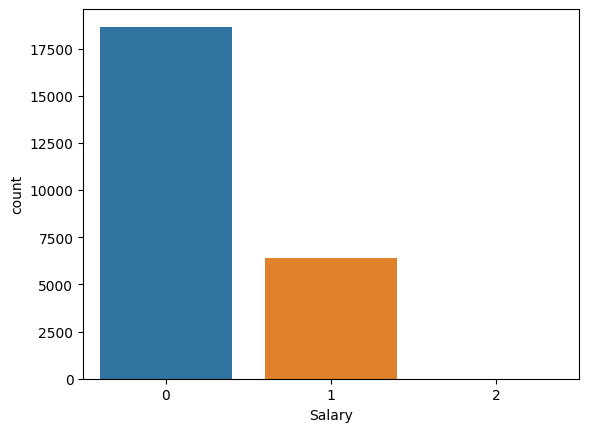

In [ ]:
sns.countplot(x='Salary',data=train1)
plt.show()

In [ ]:
train1['Salary'].value_counts()

0    18663
1     6378
2        1
Name: Salary, dtype: int64

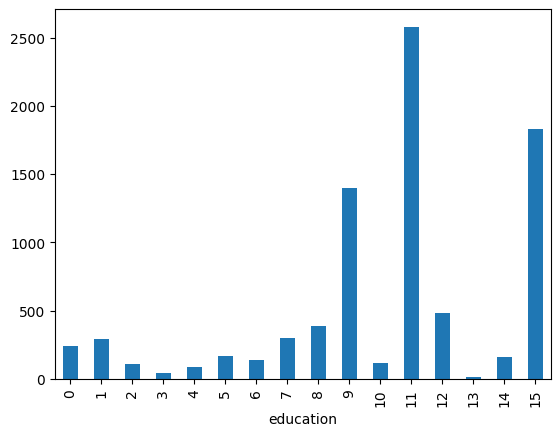

In [ ]:
pd.crosstab(train1['Salary'],train1['education']).mean().plot(kind='bar')
plt.show()

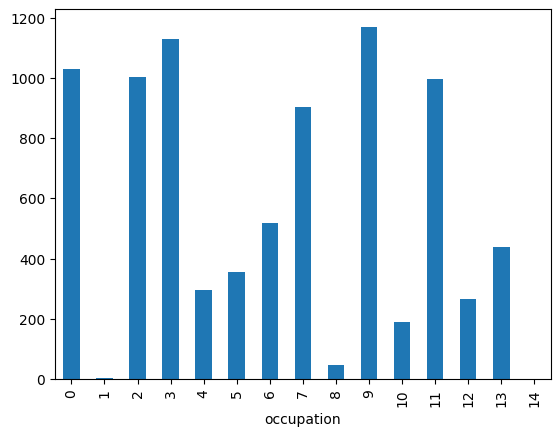

In [ ]:
pd.crosstab(train1['Salary'],train1['occupation']).mean().plot(kind='bar')
plt.show()

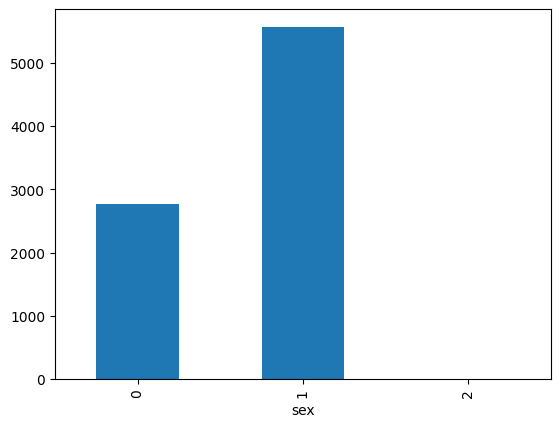

In [ ]:
pd.crosstab(train1['Salary'],train1['sex']).mean().plot(kind='bar')
plt.show()

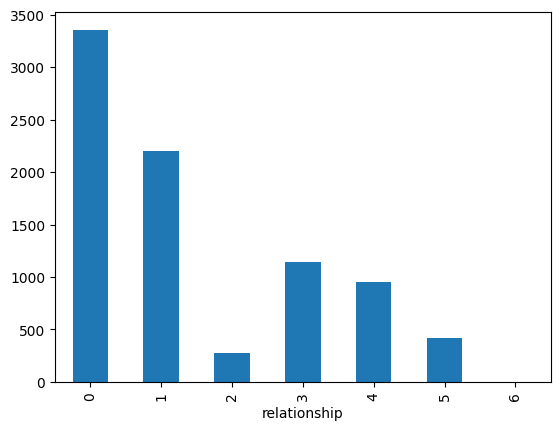

In [ ]:
pd.crosstab(train1['Salary'],train1['relationship']).mean().plot(kind='bar')
plt.show()

In [ ]:
train1.isnull()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27956,False,False,False,False,False,False,False,False,False,False,False,False,False,False
27957,False,False,False,False,False,False,False,False,False,False,False,False,False,False
27958,False,False,False,False,False,False,False,False,False,False,False,False,False,False
27959,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
train1.isnull().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       0
relationship     0
race             0
sex              0
capitalgain      1
capitalloss      1
hoursperweek     1
native           0
Salary           0
dtype: int64

In [ ]:
train1.dropna(inplace=True)

In [50]:
train1.shape

(25041, 14)

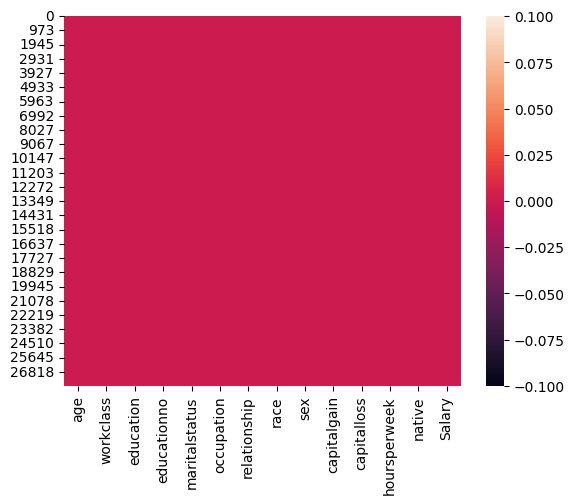

In [ ]:
sns.heatmap(train1.isnull())
plt.show()

In [ ]:
train1.corr()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
age,1.000000,0.073548,0.002084,0.038073,-0.244634,-0.003289,-0.229890,0.036847,0.071610,0.077507,0.050314,0.072574,0.008434,0.222862
workclass,0.073548,1.000000,0.020720,0.037635,-0.034176,0.015536,-0.071515,0.048731,0.081165,0.034625,0.003358,0.046250,0.012166,0.020181
education,0.002084,0.020720,1.000000,0.360163,-0.042048,-0.028491,-0.008689,0.004641,-0.031447,0.034956,0.018798,0.056014,0.077122,0.086925
educationno,0.038073,0.037635,0.360163,1.000000,-0.068587,0.083909,-0.092458,0.035181,0.013589,0.127489,0.080359,0.145504,0.096401,0.332961
maritalstatus,-0.244634,-0.034176,-0.042048,-0.068587,1.000000,0.013698,0.152824,-0.075666,-0.110599,-0.042362,-0.030693,-0.176474,-0.028477,-0.183548
occupation,-0.003289,0.015536,-0.028491,0.083909,0.013698,1.000000,-0.067109,0.008641,0.067242,0.022588,0.013857,0.023932,0.003510,0.052614
relationship,-0.229890,-0.071515,-0.008689,-0.092458,0.152824,-0.067109,1.000000,-0.111497,-0.588060,-0.063041,-0.068018,-0.246360,-0.003545,-0.246681
race,0.036847,0.048731,0.004641,0.035181,-0.075666,0.008641,-0.111497,1.000000,0.085588,0.020665,0.031892,0.054895,0.113406,0.081548
sex,0.071610,0.081165,-0.031447,0.013589,-0.110599,0.067242,-0.588060,0.085588,1.000000,0.052385,0.054327,0.227985,-0.006676,0.217750
capitalgain,0.077507,0.034625,0.034956,0.127489,-0.042362,0.022588,-0.063041,0.020665,0.052385,1.000000,-0.035734,0.081109,0.011846,0.229396


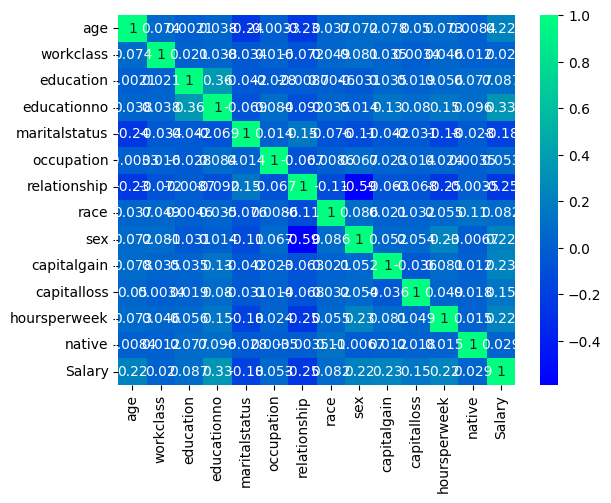

In [ ]:
sns.heatmap(train1.corr(),cmap='winter',annot=True)
plt.show()

In [ ]:
train1.describe()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
count,25041.000000,25041.000000,25041.000000,25041.000000,25041.000000,25041.000000,25041.000000,25041.000000,25041.000000,25041.000000,25041.000000,25041.000000,25041.000000,25041.000000
mean,39.050517,2.217563,10.256619,10.139292,2.563676,6.043768,1.448744,3.647818,0.667585,0.012242,0.022293,0.409647,35.235534,0.254702
std,13.206155,0.996414,3.862777,2.616748,1.529146,4.030971,1.617848,0.869089,0.471088,0.078625,0.097136,0.125622,6.265221,0.435702
min,17.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,29.000000,2.000000,9.000000,9.000000,2.000000,3.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.397959,37.000000,0.000000
50%,38.000000,2.000000,11.000000,10.000000,2.000000,6.000000,1.000000,4.000000,1.000000,0.000000,0.000000,0.397959,37.000000,0.000000
75%,48.000000,2.000000,12.000000,13.000000,4.000000,9.000000,3.000000,4.000000,1.000000,0.000000,0.000000,0.448980,37.000000,1.000000
max,90.000000,6.000000,15.000000,16.000000,6.000000,13.000000,5.000000,4.000000,1.000000,1.000000,1.000000,1.000000,39.000000,1.000000


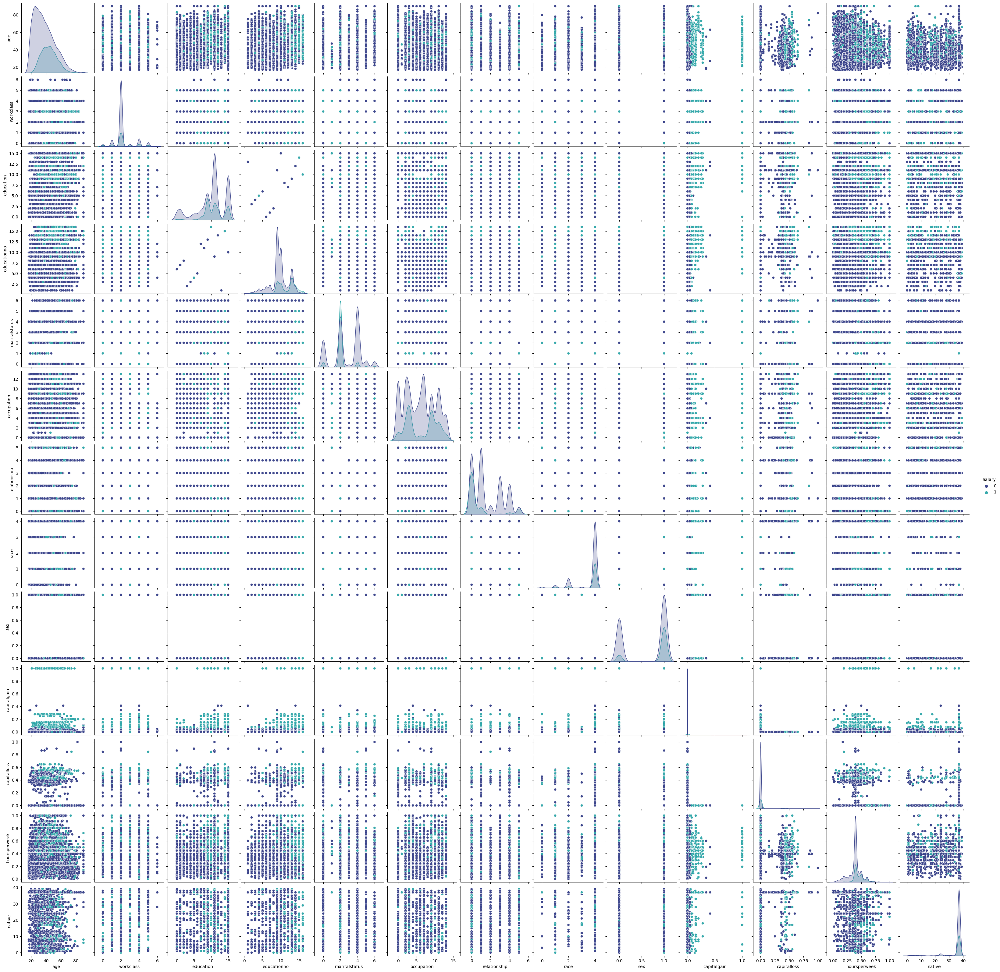

In [ ]:
sns.pairplot(train1,palette='mako',hue='Salary')
plt.show()

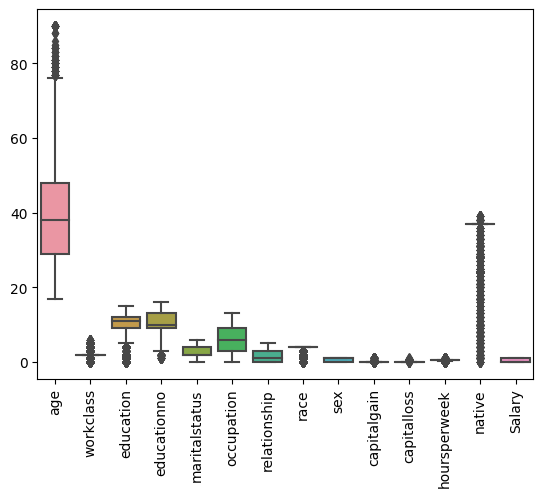

In [ ]:
sns.boxplot(data=train1)
plt.xticks(rotation=90)
plt.show()

Dividing into X and Y

In [ ]:
tr_X=train1.iloc[:,:13]
tr_y=train1.iloc[:,13]

In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
smote=SMOTE(sampling_strategy='auto')

In [ ]:
tr_X,tr_y=smote.fit_resample(tr_X,tr_y)

In [ ]:
tr_X['Salary']=tr_y

In [52]:
train=tr_X

In [53]:
train.shape

(37326, 14)

In [54]:
train['Salary'].value_counts()

0    18663
1    18663
Name: Salary, dtype: int64

In [55]:
X_train=train.iloc[:,:13]
y_train=train.iloc[:,13]

Performing Pipeline, Dimensionality reduction and Naive Bayes

In [56]:
from sklearn.pipeline import Pipeline

In [57]:
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
ppl=Pipeline([('pca',PCA()),('nb',GaussianNB())])
ppl.fit(X_train,y_train)

Pipeline(steps=[('pca', PCA()), ('nb', GaussianNB())])

In [58]:
prediction=ppl.predict(X_train)

In [59]:
prediction

array([0, 0, 0, ..., 1, 0, 1])

Confusion Matrix, Classification Score And ROC score

In [60]:
from sklearn.metrics import classification_report,confusion_matrix,roc_auc_score,roc_curve

In [61]:
confusion_matrix(y_train,prediction)

array([[15550,  3113],
       [ 5362, 13301]])

In [62]:
print(classification_report(y_train,prediction))

              precision    recall  f1-score   support

           0       0.74      0.83      0.79     18663
           1       0.81      0.71      0.76     18663

    accuracy                           0.77     37326
   macro avg       0.78      0.77      0.77     37326
weighted avg       0.78      0.77      0.77     37326



In [63]:
train_proba=ppl.predict_proba(X_train)
train_proba

array([[0.78630366, 0.21369634],
       [0.81644766, 0.18355234],
       [0.90418487, 0.09581513],
       ...,
       [0.37929108, 0.62070892],
       [0.90947139, 0.09052861],
       [0.37220077, 0.62779923]])

In [64]:
train_proba[:,1]

array([0.21369634, 0.18355234, 0.09581513, ..., 0.62070892, 0.09052861,
       0.62779923])

In [65]:
fpr,tpr,thresh=roc_curve(y_train,train_proba[:,1])

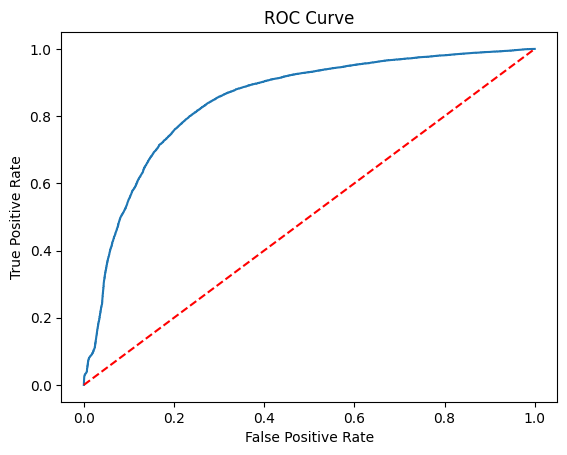

In [66]:
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1],'r--')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [67]:
roc_auc_score(y_train,prediction)

0.7729464716283556

In [68]:
from sklearn.manifold import TSNE
model=TSNE(n_components=2)

In [69]:
tsne_comp=model.fit_transform(X_train)

In [71]:
tsne_comp

array([[ 10.4288845,   1.0109533],
       [ 43.156487 ,   9.743063 ],
       [-38.60216  ,  41.63042  ],
       ...,
       [ 34.634766 ,  57.757164 ],
       [ -5.8385167,  41.97961  ],
       [  2.3690243,  -2.7586224]], dtype=float32)

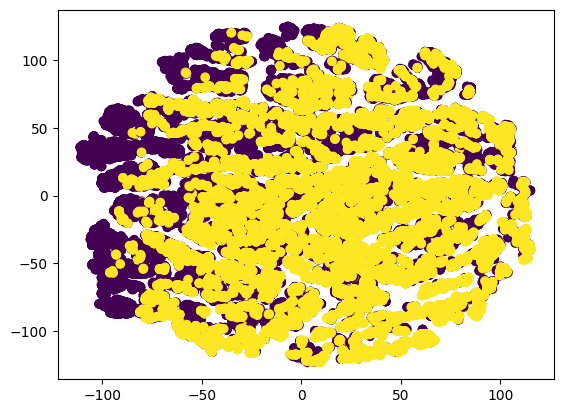

In [72]:
plt.scatter(tsne_comp[:,0],tsne_comp[:,1],c=y_train,cmap='viridis')
plt.show()

For Test Data

In [73]:
test1=pd.read_csv('/content/SalaryData_Test.csv')

In [74]:
test1

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,Private,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,33,Private,Bachelors,13,Never-married,Prof-specialty,Own-child,White,Male,0,0,40,United-States,<=50K
15056,39,Private,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K
15057,38,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K
15058,44,Private,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K


In [75]:
test1.shape

(15060, 14)

In [76]:
test1.columns

Index(['age', 'workclass', 'education', 'educationno', 'maritalstatus',
       'occupation', 'relationship', 'race', 'sex', 'capitalgain',
       'capitalloss', 'hoursperweek', 'native', 'Salary'],
      dtype='object')

In [77]:
test1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15060 entries, 0 to 15059
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   age            15060 non-null  int64 
 1   workclass      15060 non-null  object
 2   education      15060 non-null  object
 3   educationno    15060 non-null  int64 
 4   maritalstatus  15060 non-null  object
 5   occupation     15060 non-null  object
 6   relationship   15060 non-null  object
 7   race           15060 non-null  object
 8   sex            15060 non-null  object
 9   capitalgain    15060 non-null  int64 
 10  capitalloss    15060 non-null  int64 
 11  hoursperweek   15060 non-null  int64 
 12  native         15060 non-null  object
 13  Salary         15060 non-null  object
dtypes: int64(5), object(9)
memory usage: 1.6+ MB


In [78]:
test1['Salary'].unique()

array([' <=50K', ' >50K'], dtype=object)

In [79]:
test1['Salary'].value_counts()

 <=50K    11360
 >50K      3700
Name: Salary, dtype: int64

In [80]:
test1['workclass']=le.fit_transform(test1['workclass'])
test1['education']=le.fit_transform(test1['education'])
test1['maritalstatus']=le.fit_transform(test1['maritalstatus'])
test1['occupation']=le.fit_transform(test1['occupation'])
test1['relationship']=le.fit_transform(test1['relationship'])
test1['race']=le.fit_transform(test1['race'])
test1['sex']=le.fit_transform(test1['sex'])
test1['native']=le.fit_transform(test1['native'])
test1['Salary']=le.fit_transform(test1['Salary'])

In [81]:
test1['capitalgain']=mms.fit_transform(test1['capitalgain'].values.reshape(-1,1))
test1['capitalloss']=mms.fit_transform(test1['capitalloss'].values.reshape(-1,1))
test1['hoursperweek']=mms.fit_transform(test1['hoursperweek'].values.reshape(-1,1))

In [82]:
test1

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,0.000000,0.0,0.397959,37,0
1,38,2,11,9,2,4,0,4,1,0.000000,0.0,0.500000,37,0
2,28,1,7,12,2,10,0,4,1,0.000000,0.0,0.397959,37,1
3,44,2,15,10,2,6,0,2,1,0.076881,0.0,0.397959,37,1
4,34,2,0,6,4,7,1,4,1,0.000000,0.0,0.295918,37,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,33,2,9,13,4,9,3,4,1,0.000000,0.0,0.397959,37,0
15056,39,2,9,13,0,9,1,4,0,0.000000,0.0,0.357143,37,0
15057,38,2,9,13,2,9,0,4,1,0.000000,0.0,0.500000,37,0
15058,44,2,9,13,0,0,3,1,1,0.054551,0.0,0.397959,37,0


In [84]:
test1.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
15055    False
15056    False
15057    False
15058    False
15059    False
Length: 15060, dtype: bool

In [87]:
test1[test1.duplicated()]

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
551,59,2,11,9,0,7,1,4,0,0.0,0.0,0.397959,37,0
601,32,2,11,9,2,11,0,4,1,0.0,0.0,0.397959,37,0
681,40,2,11,9,2,2,0,4,1,0.0,0.0,0.397959,37,0
799,24,2,9,13,4,9,1,4,1,0.0,0.0,0.346939,37,0
1044,44,2,14,15,2,9,0,4,1,1.0,0.0,0.602041,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15043,51,2,11,9,2,2,0,4,1,0.0,0.0,0.397959,37,0
15044,22,2,15,10,4,2,3,4,1,0.0,0.0,0.397959,37,0
15049,32,2,11,9,2,5,0,4,1,0.0,0.0,0.397959,37,0
15052,31,2,11,9,2,2,0,4,1,0.0,0.0,0.397959,37,0


In [88]:
test1.drop_duplicates(inplace=True)

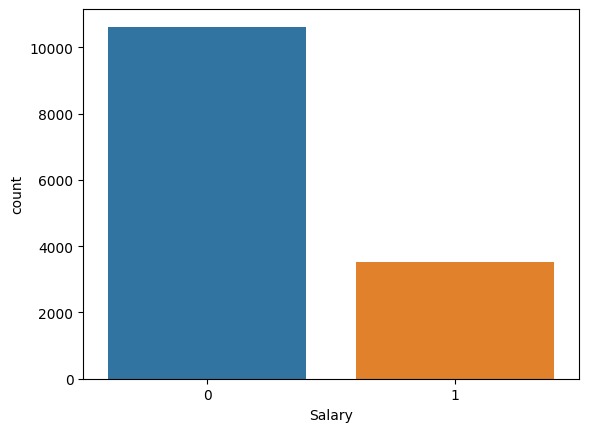

In [90]:
sns.countplot(x='Salary',data=test1)
plt.show()

In [91]:
test1['Salary'].value_counts()

0    10620
1     3510
Name: Salary, dtype: int64

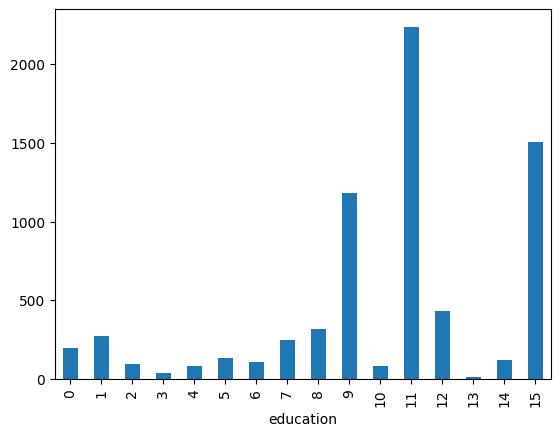

In [93]:
pd.crosstab(test1['Salary'],test1['education']).mean().plot(kind='bar')
plt.show()

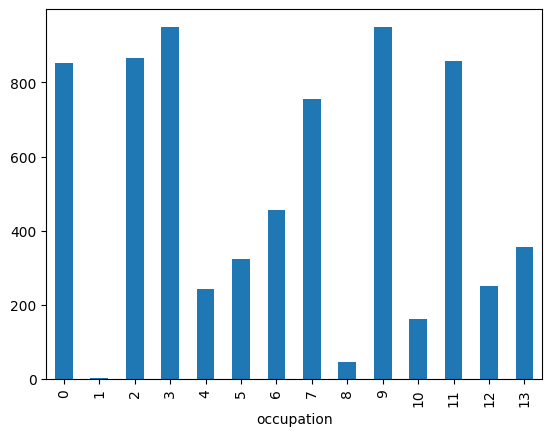

In [94]:
pd.crosstab(test1['Salary'],test1['occupation']).mean().plot(kind='bar')
plt.show()

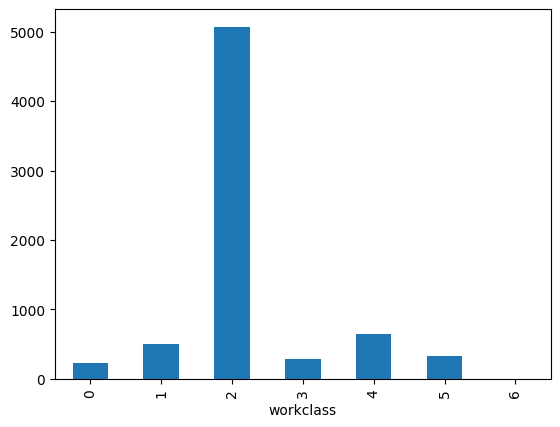

In [95]:
pd.crosstab(test1['Salary'],test1['workclass']).mean().plot(kind='bar')
plt.show()

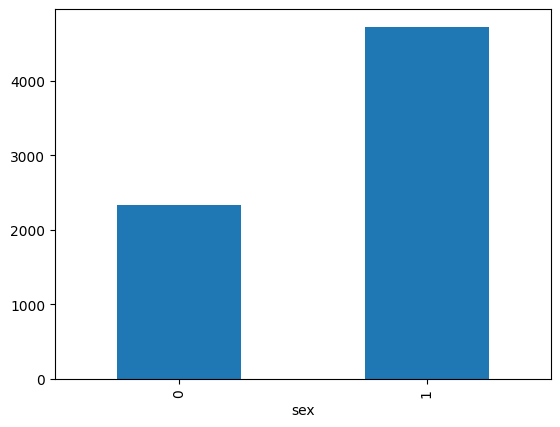

In [96]:
pd.crosstab(test1['Salary'],test1['sex']).mean().plot(kind='bar')
plt.show()

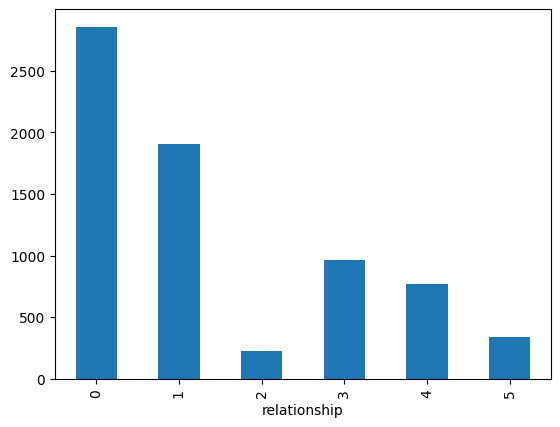

In [98]:
pd.crosstab(test1['Salary'],test1['relationship']).mean().plot(kind='bar')
plt.show()

In [99]:
test1.shape

(14130, 14)

In [100]:
test1.isnull()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,False,False,False,False,False,False,False,False,False,False,False,False,False,False
15056,False,False,False,False,False,False,False,False,False,False,False,False,False,False
15057,False,False,False,False,False,False,False,False,False,False,False,False,False,False
15058,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [101]:
test1.isnull().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       0
relationship     0
race             0
sex              0
capitalgain      0
capitalloss      0
hoursperweek     0
native           0
Salary           0
dtype: int64

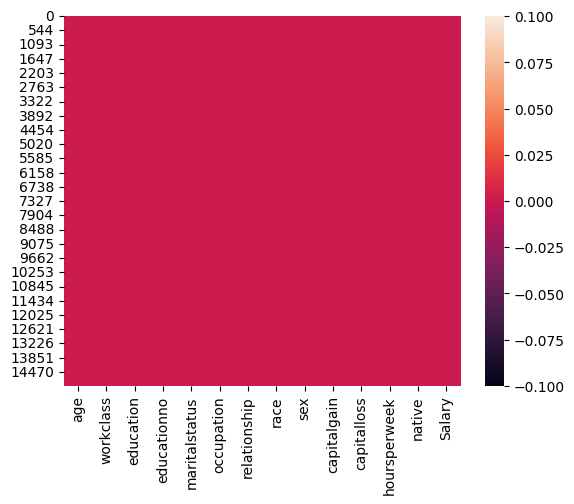

In [102]:
sns.heatmap(test1.isnull())
plt.show()

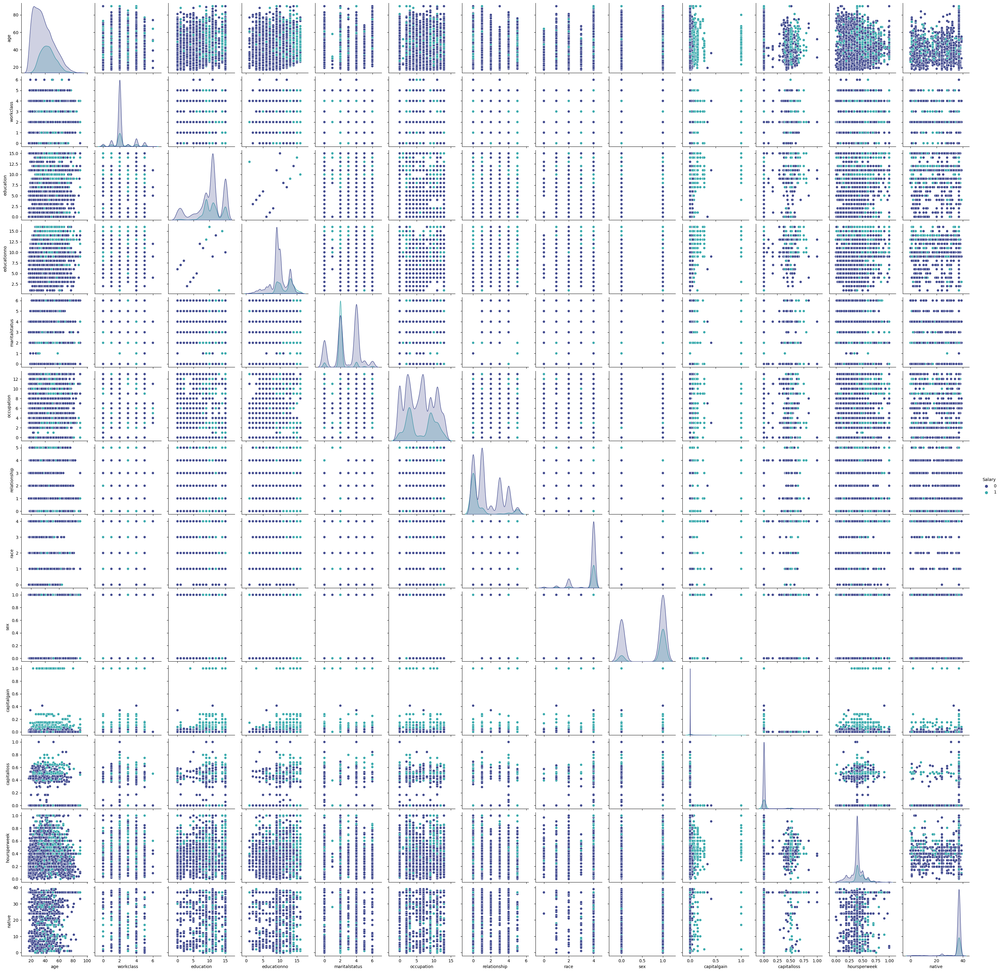

In [103]:
sns.pairplot(data=test1,hue='Salary',palette='mako')
plt.show()

In [104]:
test1.corr()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
age,1.000000,0.092686,-0.004167,0.021979,-0.245822,-0.003881,-0.241180,0.035180,0.075150,0.076765,0.053172,0.088090,0.001787,0.216703
workclass,0.092686,1.000000,0.021149,0.047708,-0.030821,0.020147,-0.063257,0.064707,0.062290,0.031858,0.007808,0.051189,-0.000432,0.011495
education,-0.004167,0.021149,1.000000,0.361666,-0.044471,-0.017227,-0.013293,0.007635,-0.027574,0.030424,0.024271,0.064155,0.075685,0.092476
educationno,0.021979,0.047708,0.361666,1.000000,-0.070693,0.093437,-0.080444,0.030924,0.000603,0.132346,0.085651,0.127779,0.099699,0.326777
maritalstatus,-0.245822,-0.030821,-0.044471,-0.070693,1.000000,-0.001040,0.172341,-0.076084,-0.114448,-0.042549,-0.033647,-0.165199,-0.017963,-0.185870
occupation,-0.003881,0.020147,-0.017227,0.093437,-0.001040,1.000000,-0.054695,0.004326,0.050982,0.011623,0.012946,0.014548,0.003006,0.046633
relationship,-0.241180,-0.063257,-0.013293,-0.080444,0.172341,-0.054695,1.000000,-0.119236,-0.580247,-0.056609,-0.051241,-0.257082,0.003405,-0.254418
race,0.035180,0.064707,0.007635,0.030924,-0.076084,0.004326,-0.119236,1.000000,0.087171,0.016730,0.020725,0.041720,0.120543,0.073101
sex,0.075150,0.062290,-0.027574,0.000603,-0.114448,0.050982,-0.580247,0.087171,1.000000,0.047180,0.048382,0.227884,-0.017165,0.212100
capitalgain,0.076765,0.031858,0.030424,0.132346,-0.042549,0.011623,-0.056609,0.016730,0.047180,1.000000,-0.033929,0.089512,0.008189,0.225871


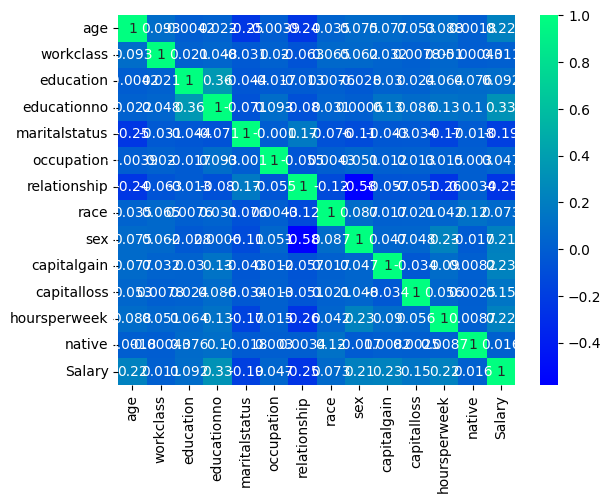

In [109]:
sns.heatmap(test1.corr(),cmap='winter', annot=True)
plt.show()

In [110]:
test1.describe()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
count,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000
mean,39.155414,2.226893,10.223355,10.120736,2.589597,6.054140,1.419321,3.664402,0.669144,0.011859,0.025066,0.408917,35.367657,0.248408
std,13.429544,0.991812,3.866601,2.602557,1.524079,4.021648,1.597793,0.849100,0.470538,0.079033,0.110864,0.125184,6.057064,0.432105
min,17.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,29.000000,2.000000,9.000000,9.000000,2.000000,3.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.397959,37.000000,0.000000
50%,38.000000,2.000000,11.000000,10.000000,2.000000,6.000000,1.000000,4.000000,1.000000,0.000000,0.000000,0.397959,37.000000,0.000000
75%,48.000000,2.000000,12.000000,13.000000,4.000000,9.000000,3.000000,4.000000,1.000000,0.000000,0.000000,0.448980,37.000000,0.000000
max,90.000000,6.000000,15.000000,16.000000,6.000000,13.000000,5.000000,4.000000,1.000000,1.000000,1.000000,1.000000,39.000000,1.000000


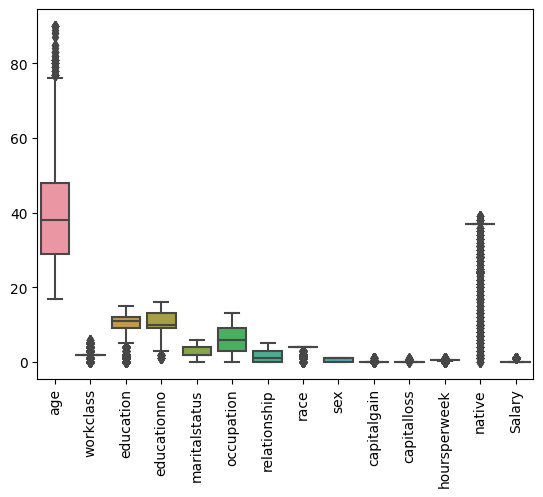

In [111]:
sns.boxplot(data=test1)
plt.xticks(rotation=90)
plt.show()

In [112]:
te_X=test1.iloc[:,:13]
te_y=test1.iloc[:,13]

In [113]:
te_X,te_y=smote.fit_resample(te_X,te_y)
te_X['Salary']=te_y

In [114]:
test=te_X

In [115]:
test.shape

(21240, 14)

In [116]:
test['Salary'].value_counts()

0    10620
1    10620
Name: Salary, dtype: int64

In [117]:
X_test=test.iloc[:,:13]
y_test=test.iloc[:,13]

In [118]:
prediction1=ppl.predict(X_test)

In [119]:
prediction1

array([0, 1, 1, ..., 1, 0, 1])

In [120]:
print(classification_report(y_test,prediction1))

              precision    recall  f1-score   support

           0       0.74      0.83      0.78     10620
           1       0.80      0.71      0.75     10620

    accuracy                           0.77     21240
   macro avg       0.77      0.77      0.77     21240
weighted avg       0.77      0.77      0.77     21240



In [121]:
test_proba=ppl.predict_proba(X_test)

In [122]:
test_proba

array([[9.99914824e-01, 8.51755545e-05],
       [3.71240273e-01, 6.28759727e-01],
       [4.42149422e-01, 5.57850578e-01],
       ...,
       [7.83165395e-02, 9.21683460e-01],
       [7.36452458e-01, 2.63547542e-01],
       [1.29128374e-01, 8.70871626e-01]])

In [123]:
test_proba[:,1]

array([8.51755545e-05, 6.28759727e-01, 5.57850578e-01, ...,
       9.21683460e-01, 2.63547542e-01, 8.70871626e-01])

In [124]:
fpr1,tpr1,thresh1=roc_curve(y_test,test_proba[:,1])

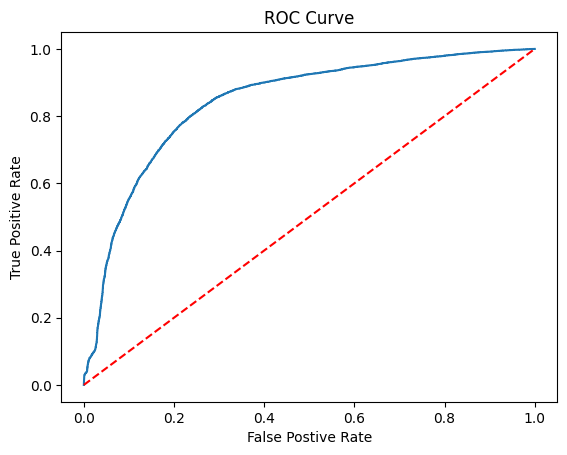

In [125]:
plt.plot(fpr1,tpr1)
plt.plot([0,1],[0,1],'r--')
plt.title('ROC Curve')
plt.xlabel('False Postive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [126]:
roc_auc_score(y_test,prediction1)

0.7691148775894538

In [127]:
tsne_comp1=model.fit_transform(X_test)

In [128]:
tsne_comp1

array([[-23.88798   ,  99.80258   ],
       [-30.201717  ,  49.42154   ],
       [-47.65705   ,  -0.8386731 ],
       ...,
       [ 22.27932   , -55.024277  ],
       [ 74.0571    ,  22.934795  ],
       [ 59.76147   ,   0.83222973]], dtype=float32)

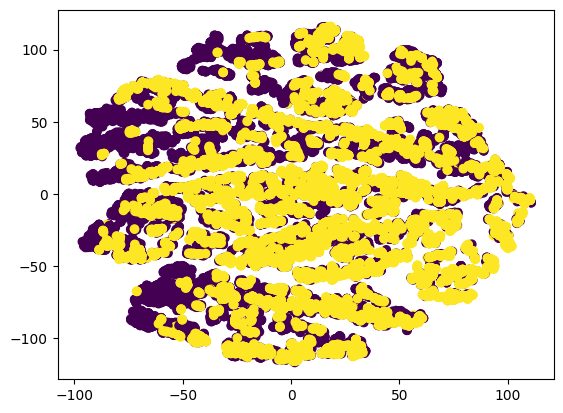

In [129]:
plt.scatter(tsne_comp1[:,0],tsne_comp1[:,1],c=y_test,cmap='viridis')
plt.show()